In [1]:
import numpy as np
import numpy.fft as fft
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from ipywidgets import interact, interact_manual
from IPython.display import display, FileLink, FileLinks, HTML
from clawpack.visclaw import animation_tools
%matplotlib inline
%pylab inline

Populating the interactive namespace from numpy and matplotlib


<h1 align="center">Numerical Methods for</h1>
<h1 align="center">Korteweg–de Vries equation (KdV)</h1>

<h3 align="center">Season Yang, ys2679  | Fanchen Zeng, hc2857 </h3> 

## 1. Introduction

The dynamic balance between dispersion and nonlinear effects result in the water wave soliton.  The Korteweg-de Vries equation is then one of the most typical soliton phenomena of all model equations of the nonlinear wave.

In this project, we aim to study the Korteweg-de Vries (KdV) equation, a mathematical model of waves on shallow water surfaces. The discovery of the Kdv equation started with experiments by John Scott Russell in 1834.[2] While conducting experiments to determine the most efficient design for canal boats, Russel observed and later described in his text:

> I was observing the motion of a boat which was rapidly drawn along a narrow channel by a pair of horses, when the boat suddenly stopped - not so the mass of water in the channel which it had put in motion; it accumulated round the prow of the vessel in a state of violent agitation, then suddenly leaving it behind, rolled forward with great velocity, assuming the form of a large solitary elevation, a rounded, smooth and well-defined heap of water, which continued its course along the channel apparently without change of form or diminution of speed. I followed it on horseback and overtook it still rolling on at a rate of some eight or nine miles an hour, preserving its original figure some thirty feet long and a foot to a foot and a half in height. Its height gradually diminished, and after a chase of one or two miles, I lost it in the windings of the channel.

![p2](./images/p2.png)

This nonlinear Partial Differentiation equation of third order have been of interests in various fields. Two different mechanisms, nonlinearity, and dispersion are the model in KdV equation and a remarkable property of this equation is that the balance between these two mechanisms will produce solitary waves. **Solitons** then represents several solitary waves in the model. In the recent study, KdV equation has been found to describe wave phenomena in plasma physic, bubble-liquid mixtures, and anharmonic crystals.

![Option P&L](./images/p1.png)


### 1.1 Mathematical Formulation
Dervied from conservation equations in fluid motions:
$$\begin{aligned}
\partial_t\rho + \nabla\cdot(\rho\vec{v}) &= 0 \\
\rho(\partial_t+{\vec{v}}\cdot\nabla)\vec{v} &= -\nabla P + \vec{f}
\end{aligned}$$
or linear dispersive equations:
$$u_t + u_{xxx} = 0,$$
we obtain the family of initial value problem, named ***k-generalized Korteweg-de Vries equation***:

$$
     \left \{ \begin{aligned}
        & \partial_t u + \partial^3_x u + u^k\partial_x u = 0, \\
        & u(x,0) = u_0(x)
    \end{aligned} \right .
$$

The case k = 1 is known as the **Korteweg–de Vries (KdV) equation** and is the most famous of the family.

In this project, we aim to solve the problem in 1-dimension space variable $x$, and the function of $u$ depends on the variables $x$ and $t$, which describes the elongation of the wave at place $x$ and time $t$.  The mathamatical model follows:

$$\frac{\partial u}{\partial t} + \frac{\partial (3u)^2}{\partial x} + \frac{\partial^3 u}{\partial x^3} = 0$$
or
$$\partial_t u(x,t) + 6u(x,t)\partial_x(x,t) + \partial^3_xu(x,t) = 0$$


This is the Korteweg-de Vries Equation (KdV) which is nonlinear because of the product is shown in the second summand and which is of third order because of the third derivative as highest in the third summand. Factor 6 is just a scaling factor to make solutions easier to describe. [2]

Here we see the two mechanisms: [5]
* 1 Nonlinearity ($6uu_x$) that tends to steepen those parts having negative slope,
* 2 Dispersion ($u_{xxx}$) that makes dispersive wave components of different wave numbers propagate at different velocities.

### 1.2 Exact Solution

In this subsection we will find the general exact solution to the Koreteweg-de Vries equation.  Noted that here we have neither initial conditions nor the boundary conditions.

Here we are seeking traveling wave solution wit the form 
$$u(x,t) = f(\xi - \beta\tau)$$
where
$$u(x,t) = f(z), ~~~ z = \xi - \beta\tau$$
with $|z| \to \infty \Rightarrow \,f,f',f'' \to 0$.  
Then substitute $u(x,t) = f(z)$ into KdV equation and will result in a Ordinary Differential Equation:

$$-\beta\, f'(z) + 6f(z)\,f'(z) + f'''(z) = 0$$

Then directly integrate this ODE and will become: (Noted that the constant on the RHS vanishes because of the decay condition in f.)

$$-\beta\, f + 6f^2 + f''= 0$$

Then we multiply both sides by $f'$ and we then also do the integration directly

$$-\beta\, ff' + 6f^2f' + f''f'= 0$$

$$-\frac{1}{2}\beta\,f^2 + f^3 + \frac{1}{2}(f')^2 = 0$$

Again, the constant on the RHS vanishes because of the decay condition in f.
So the equation above can be rewrite as:

$$(f')^2 = \beta\, f^2-2f^3 = f^2(\beta - 2f)$$
or 
$$\frac{df}{dz} = \sqrt{f^2(\beta - 2f)} = \pm f\sqrt{\beta - 2f}$$

Now we try to solve this, noted a real soluton only exists only if $\beta -2f\geq 0.$
By seperation of variables:

$$f\frac{df}{d\sqrt{\beta - 2f}} = \pm (z - z_0)$$

Now we assume the solution follows:
$$f = \frac{1}{2}\beta \,\text{sech}^2 w$$
$$
\begin{aligned}
\frac{df}{dz} &= (\beta\,\text{sech}\, w)(-\,\text{sech}\,w\,\text{tanh}\,w) \\
&= -\beta\text{ sech}^2\,w\text{ tanh }w
\end{aligned}
$$
and
$$
\begin{aligned}
I &= \int\frac{df}{d\sqrt{\beta - 2f}}\\
&= -\int\frac{\beta\text{ sech}^2\,w\text{ tanh }wdw}{\frac{1}{2}\beta\text{ sech}^2\,w\sqrt{\beta(1-\text{ sech}^2w)}}\\
&=-\int\frac{\text{ tanh }wdw}{\frac{1}{2}\sqrt{\beta}\text{ tanh }w}\\
&= -\frac{2}{\beta} w.
\end{aligned}
$$

Hence,
$$
\begin{aligned}
-\frac{2}{\beta} w.&= \pm (z-z_0)\\
w &= \mp \frac{\sqrt{\beta}}{2}(z-z_0) \\
\end{aligned}
$$
Since $f = \frac{1}{2}\beta \text{ sech}^2w$

$$f(z) = \frac{1}{2}\beta \text{ sech}^2\frac{\sqrt{\beta}}{2}(z-z_0)$$

So the exact solution to the Kdv Equation with no initial and no boundary condition is:

$$u(x,t) = \frac{\beta}{2}\text{ sech}^2\left[\frac{\sqrt{\beta}}{2}(x-\beta t)\right]$$

#### Example:

In [2]:
## Some simulations of the exact solutions

c_1 = 16.
def u_true_single(x,t):
#     u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2) #+ 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+1 - c_2*t)/2.))**(-2)
    u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2)
    return u

N = 256
x = np.linspace(-10,10,N)
t0 = 0.
tfinal = 1.

dt = 0.4/(N**2)
t = np.arange(t0,tfinal, dt)
nplt = floor((tfinal/100)/dt) 
nmax = round(tfinal/dt)

figs = []
for n in xrange(len(t)):
    T = n*dt
    if n % nplt == 0:
        fig = figure()
        plt.plot(x, u_true_single(x,T), 'k', label = "True")
        plt.ylim([-0.5, 8.5])
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)

images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

## 2. Numerical Approximation and Analysis

In this section we will focus on solving the KdV equation in two approaches -- Finite Difference and Spectral Method.

### 2.1 Finite Difference

In this subsection, we will solve the KdV equation with different Finite Difference methodes.

#### 2.1.1 Forward Euler in time and Central Difference in space

For our first try, regardless of consideration whether it is going to work or not, we use our traditional method -- Forward Euler in time and Centeral Difference in space. 

Our KdV is written as:
$$\frac{\partial u}{\partial t} + 6u\frac{\partial (u)}{\partial x} + \frac{\partial^3 u}{\partial x^3} = 0$$

Discretize in time with Forward Euler follows:
$$ u(x, t+\Delta t) = u(x,t) + \Delta t f$$

Discretize in space with Central Difference follows:

$$\frac{\partial (u)}{\partial x} = \frac{U^n_{j+1} - U^n_{j-1}}{2\Delta x}, ~~~ \frac{\partial^3 u}{\partial x^3} = \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3}$$

So our first formulation is 
$$
    \frac{U_j^{n+1} - U_j^n}{\Delta t} = -6 U_j^n \frac{U_{j+1}^n - U_{j-1}^n}{2 \Delta x} - \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3}
$$
or 
$$
    {U_j^{n+1}} =  U_j^n  - \Delta t\left(6 U_j^n \frac{U_{j+1}^n - U_{j-1}^n}{2 \Delta x} - \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3}\right)
$$

Since we cannot apply the von Neumann analysis directly to KdV equation, we first estimate stability criterion by looking at the linear part of it (because $u_{xxx}$ is dominate part):

$$
    u_t = - u_{xxx}
$$

Applying forward Euler finite difference to time and center finite difference to space

$$
    U_j^{n+1} = U_j^n + \frac{\Delta t}{\Delta x^3} \left( U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n \right)
$$    

Using $U_j^n = g(\xi)^n e^{i \xi j \Delta x}$

$$
    g(\xi) = 1 + \frac{\Delta t}{\Delta x^3} \left( e^{2i \xi \Delta x} - 2 e^{i \xi \Delta x} + 2 e^{-i \xi \Delta x} - e^{-2i \xi \Delta x} \right)
$$

Since we want $|g(\xi)| < 1$, so

$$
    -1 < |g(\xi)|^2 = 1 - \left( \frac{\Delta t}{\Delta x^3} \left(2 \sin(2 \xi \Delta x) - 4 \sin(\xi \Delta x)  \right)\right)^2 < 1
$$

$$
    \Delta t < \frac{\Delta x^3}{\sin(2 \xi \Delta x) - 2 \sin(\xi \Delta x)}
$$

When $\xi \Delta x = \frac 4 3 \pi$, $\sin(2 \xi \Delta x) - 2 \sin(\xi \Delta x)$ attains maximum value $\frac{3\sqrt{3}}{2}$. Thus,

$$
    \Delta t < \frac{2\Delta x^3}{3 \sqrt{3}}
$$

**Code Implementation**

In [3]:
def first(N, dt, f, t_final):
    x = np.linspace(-20,20,N)
    dx = x[1] - x[0]
    c_1 = 2.
    u = f(x)

    t_range = np.arange(0., t_final, dt)
    n = len(t_range)
    m = len(u)

    nplt = floor((1./20)/dt) 

    c1 = dt/dx
    c2 = dt/(dx**3)

    U = np.empty((n,m))
    U[0,:] = u

    figs = []
    for k in xrange(n-1):
        U[k+1,0] = 0#U[k,0] - 3.*c1*U[k,0]*(U[k,1] - U[k,-1]) - 0.5 * c2*(U[k,2] - 2*U[k,1] + 2.*U[k,-1] - U[k,-2])
        U[k+1,1] = 0#U[k,1] - 3.*c1*U[k,1]*(U[k,2] - U[k,0]) - 0.5 * c2*(U[k,3] - 2*U[k,2] + 2.*U[k,0] - U[k,-1])
        U[k+1,-1] = U[k+1,0]
        U[k+1,-2] = U[k+1,1]

        for i in xrange(2,m-2):
            U[k+1,i] = U[k,i] - 3.*c1*U[k,i]*(U[k,i+1] - U[k,i-1]) - 0.5* c2*(U[k,i+2] - 2*U[k,i+1] + 2.*U[k,i-1] - U[k,i-2])

    return U, x, nplt


In [4]:
figs = []
dt = 0.0001
figs = []
c_1 = 2.
t_final = 2.
u_ini_single = lambda x: 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8)/2.))**(-2)
U, x, nplt = first(N=256, dt=dt, f=u_ini_single, t_final=t_final)
u_true_single = lambda x, t: 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2)
for k in xrange(U.shape[0]):
    t = k * (t_final / U.shape[0]) 
    if k % nplt == 0:
        fig = figure()
        plt.plot(x, U[k,:], 'ro', label = "FTCS")
        plt.plot(x, u_true_single(x, t), 'k--', label = "True")
        plt.xlim([-20., 20.])
        plt.ylim([-0.2, 1.1])
        plt.title('FTCS under $ \Delta t = $%s' %dt)
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)
images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

/Users/seasonyang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:27: RuntimeWarning: overflow encountered in double_scalars
/Users/seasonyang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:27: RuntimeWarning: invalid value encountered in double_scalars


In [5]:
figs = []
c_1 = 2.
c_2 = 4.
dt = 0.0001
t_final = 2.
u_ini_double = lambda x: 0.5*c_1*(np.cosh(np.sqrt(c_1)*(x)/2.))**(-2) + 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+8)/2.))**(-2)
U, x, nplt = first(N=256, dt=dt, f=u_ini_double, t_final=t_final)
u_true_double = lambda x, t:0.5*c_1*(np.cosh(np.sqrt(c_1)*(x - c_1*t)/2.))**(-2) + 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+8 - c_2*t)/2.))**(-2)
for k in xrange(U.shape[0]):
    t = k * (t_final / U.shape[0]) 
    if k % nplt == 0:
        fig = figure()
        plt.plot(x, U[k,:], 'ro',label = "FTCS")
        plt.plot(x, u_true_double(x, t), 'k--',label = "True")
        plt.xlim([-20., 20.])
        plt.ylim([-0.2, 2.1])
        plt.title('FTCS under $ \Delta t = $%s' %dt)
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)
images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

/Users/seasonyang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:27: RuntimeWarning: overflow encountered in double_scalars
/Users/seasonyang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:27: RuntimeWarning: invalid value encountered in double_scalars


**Comment:**

Here as shown in the above two simulations, while FTCS works for the few iterations, as time forward, we see that we have a error accumulation and thus it blow it. Thus, we know that FTCS is an unstable method and we will discuss it in the later section.

#### 2.1.2 Zabusky and Kruskal Scheme
The second approach is Zabusky and Kruskal Scheme [4] or a modified leap-frog method.  
Recall a traditional leap-frog method follows:

$$
    \frac{U^{n+1}_j - U^{n-1}_j}{2 \Delta t} + U^n_j \frac{U^n_{j+1} - U^n_{j-1}}{2\Delta x} +\frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3}= 0
$$


Then we use some modification and results in Zabusky and Kruskal Scheme [4]:

$$
    \frac{U^{n+1}_j - U^{n-1}_j}{2 \Delta t} + (U^n_{j+1} + U^n_j + U^n_{j-1}) \frac{U^n_{j+1} - U^n_{j-1}}{\Delta x} +\frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3}= 0
$$

In the updated form 
$$
    U^{n+1}_j = U^{n-1}_j - 2 \frac{\Delta t}{\Delta x}(U^n_{j+1} + U^n_j + U^n_{j-1})(U^n_{j+1} - U^n_{j-1}) - \frac{\Delta t}{(\Delta x)^3} (U^n_{j+2} - 2U^n_{j+1} + 2 U^n_{j-1} - U^n_{j-2})
$$
with first time step
$$
    U^{1}_j = U^{0}_j -  \frac{\Delta t}{\Delta x}(U^0_{j+1} + U^0_j + U^0_{j-1})(U^0_{j+1} - U^0_{j-1}) - \frac{\Delta t}{2(\Delta x)^3} (U^0_{j+2} - 2U^0_{j+1} + 2 U^0_{j-1} - U^0_{j-2})
$$


This Scheme is a three-level scheme, meaning second order in time with Truncation error follows $\mathcal{O}(\Delta t)^2 + \mathcal{O}(\Delta x)^2$.  To ensure stability, the scheme have condition:

$$\frac{\Delta t}{\Delta x}\left| -2u_0 + \frac{1}{(\Delta x)^2} \right| \leq \frac{2}{3\sqrt{3}}$$

where $u_0$ is the maximum value of $u$ depending on the amplitutde of solitons and a **very small time step** is required to satisify above inequality. [4]

**Code Implementation**

In [6]:
def leap_frog(N, dt, f, t_final=3.):
    x = np.linspace(-20,20,N)
    dx = x[1] - x[0]
    c_1 = 2.
    u = f(x)
    
    t_range = np.arange(0., t_final, dt)
    n = len(t_range)
    m = len(u)

    nplt = floor((2./20)/dt) 

    c1 = dt/dx
    c2 = dt/(dx**3)

    U = np.empty((n,m))
    U[0,:] = u

    U[1,0] = 0#U[0,0] - c1*(U[0,1]+ U[0,0] + U[0,-1])*(U[0,1] - U[0,-1]) - c2*0.5*(U[0,2] - 2*U[0,1] + 2.*U[0,-1] - U[0,-2])
    U[1,1] = 0#U[0,1] - c1*(U[0,2]+ U[0,1] + U[0,0])*(U[0,2] - U[0,0]) - c2*0.5*(U[0,3] - 2*U[0,2] + 2.*U[0,0] - U[0,-1])
    U[1,-1] = U[1,0]
    U[1,-2] = U[1,1]

    for i in xrange(2,m-2):
        U[1,i] = U[0,i] - c1*(U[0,i+1]+ U[0,i] + U[0,i-1])*(U[0,i+1] - U[0,i-1]) - c2*0.5*(U[0,i+2] - 2*U[0,i+1] + 2.*U[0,i-1] - U[0,i-2])

    for k in xrange(1,n-1):
        U[k+1,0] = 0#U[k-1,0] - 2.*c1*(U[k,1]+ U[k,0] + U[k,-1])*(U[k,1] - U[k,-1]) - c2*(U[k,2] - 2*U[k,1] + 2.*U[k,-1] - U[k,-2])
        U[k+1,1] = 0#U[k-1,1] - 2.*c1*(U[k,2]+ U[k,1] + U[k,0])*(U[k,2] - U[k,0]) - c2*(U[k,3] - 2*U[k,2] + 2.*U[k,0] - U[k,-1])
        U[k+1,-1] = U[k+1,0]
        U[k+1,-2] = U[k+1,1]

        for i in xrange(2,m-2):
            U[k+1,i] = U[k-1,i] - 2.*c1*(U[k,i+1]+ U[k,i] + U[k,i-1])*(U[k,i+1] - U[k,i-1]) - c2*(U[k,i+2] - 2*U[k,i+1] + 2.*U[k,i-1] - U[k,i-2])
    return U, x, nplt

In [7]:
figs = []
c_1 = 2.
u_ini_single = lambda x: 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8)/2.))**(-2)
dt = 0.0001
t_final = 2.
U, x, nplt = leap_frog(N=256, dt=dt, f=u_ini_single, t_final=t_final)
u_true_single = lambda x, t: 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2)
for k in xrange(U.shape[0]):
    t = k * (t_final / U.shape[0])  
    if k % nplt == 0:
        fig = figure()
        plt.plot(x, U[k,:], 'ro', label = "Zabusky")
        plt.plot(x, u_true_single(x, t), 'k--', label = "True")
        plt.xlim([-20., 20.])
        plt.ylim([-0.2, 1.1])
        plt.title('Leap_frog under $ \Delta t = $%s' %dt)
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)
images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

In [8]:
figs = []
c_1 = 2.
c_2 = 4.
u_ini_double = lambda x: 0.5*c_1*(np.cosh(np.sqrt(c_1)*(x)/2.))**(-2) + 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+8)/2.))**(-2)
dt = 0.0001
t_final = 2.
U, x, nplt = leap_frog(N=256, dt=dt, f=u_ini_double, t_final=t_final)
u_true_double = lambda x, t:0.5*c_1*(np.cosh(np.sqrt(c_1)*(x - c_1*t)/2.))**(-2) + 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+8 - c_2*t)/2.))**(-2)
for k in xrange(U.shape[0]):
    t = k * (t_final / U.shape[0]) 
    if k % nplt == 0:
        fig = figure()
        plt.plot(x, U[k,:], 'ro', label ="Zabusky")
        plt.plot(x, u_true_double(x, t), 'k--', label = "True")
        plt.xlim([-20., 20.])
        plt.ylim([-0.2, 2.1])
        plt.title('Leap_frog under $ \Delta t = $%s and t_final = %s' %(dt, t_final))
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)
images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

**Comment:**

Here as shown in the above two simulations, we see that modified Leap-frog works a lot better than FTCS and numerical approximations follows the true solutions in both single or double solitons simulations. Our numerical analysis will be presented in next section.

#### 2.1.3 Implicit Method 
In the previous two sections we use explicit finite difference method and in this subsection we will try to solve the KdV equation using implicit method.

$$
    \frac{1}{\Delta t} (U_j^{n+1} - U_j^n) + \frac{1}{\Delta x} [U_{j+1}^{n+1} (U_j^n + U_{j+1}^n) - U_{j-1}^{n+1}(U_j^n + U_{j-1}^n)] + \frac{1}{2 \Delta x^3} (U_{j+2}^{n+1} - 2 U_{j+1}^{n+1} + 2 U_{j-1}^{n+1} - U_{j-2}^{n+1}) = 0
$$

Separate $U^n$ and $U^{n+1}$ and our formula follows:

$$
    -\frac{1}{2\Delta x^3} U_{j-2}^{n+1} + (-\frac{1}{\Delta x} (U_j^n + U_{j-1}^n) + \frac{1}{\Delta x^3}) U_{j-1}^{n+1} + \frac{1}{\Delta t} U_j^{n+1} + (\frac{1}{\Delta x} (U_j^n + U_{j+1}^n) - \frac{1}{\Delta x^3}) U_{j+1}^{n+1} + \frac{1}{2\Delta x^3} U_{j+2}^{n+1} = \frac{1}{\Delta t} U_j^n
$$

**However**, we did not successfully coded up this method with reasonable error.  We tried to look at the reason behind our unsuccessful test.  We then analyzed the implicit matrix.

/Users/seasonyang/anaconda/lib/python2.7/site-packages/matplotlib/ticker.py:2011: RuntimeWarning: overflow encountered in power
  ticklocs = b ** decades


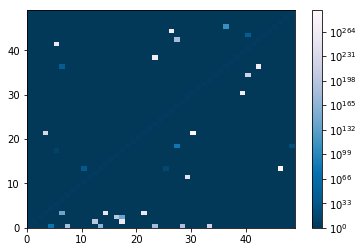

In [9]:
'''Please run second time if failed'''

dx = 0.2
dt = 1e-4
x_range = numpy.arange(0, 10, dx)
t_range = numpy.arange(0, 2, dt)
u = np.empty((len(t_range), len(x_range)))
A = numpy.empty((len(x_range), len(x_range)))
i = 1
A[0, 0:3] = numpy.array([1./ dt, 
                         (1. / dx) * (u[i-1, 0] + u[i-1, 1]) - (1. / dx**3), 
                         0.5 / dx**3])
A[0, -2:] = numpy.array([- 0.5 / dx**3, 
                         - (1. / dx) * (u[i-1, 0] + u[i-1, -1]) + (1. / dx**3)])
A[1, 0:4] = numpy.array([- (1. / dx) * (u[i-1, 1] + u[i-1, 0]) + (1. / dx**3), 
                         1./ dt, 
                         (1. / dx) * (u[i-1, 1] + u[i-1, 2]) - (1. / dx**3), 
                         0.5 / dx**3])
A[1, -1] = - 0.5 / dx**3
for j in xrange(2, len(x_range) - 2):
    A[j, j-2:j+3] = numpy.array([- 0.5 / dx**3, 
                                 - (1. / dx) * (u[i-1, j] + u[i-1, j-1]) + (1. / dx**3), 
                                 1./ dt, 
                                 (1. / dx) * (u[i-1, j] + u[i-1, j+1]) - (1. / dx**3), 
                                 0.5 / dx**3])
A[-2, 0] = 0.5 / dx**3
A[-2, -4:] = numpy.array([- 0.5 / dx**3, 
                          - (1. / dx) * (u[i-1, -2] + u[i-1, -3]) + (1. / dx**3), 
                          1./ dt, 
                          (1. / dx) * (u[i-1, -2] + u[i-1, -1]) - (1. / dx**3)])
A[-1, :2] = numpy.array([(1. / dx) * (u[i-1, -1] + u[i-1, 0]) - (1. / dx**3), 
                        0.5 / dx**3])
A[-1, -3:] = numpy.array([- 0.5 / dx**3, 
                          - (1. / dx) * (u[i-1, -1] + u[i-1, -2]) + (1. / dx**3), 
                          1./ dt])

from matplotlib.colors import LogNorm
x = numpy.array(range(50))
y = x.copy()
z = A.reshape(50**2)
X, Y = numpy.meshgrid(x, y)
B = numpy.abs(A)+1.
plt.pcolor(X,Y,B, cmap='PuBu_r',norm=LogNorm(vmin=B.min(), vmax=B.max()))
plt.colorbar()

**Commment:** Here we see the matrix is ill-posed with extremely high value

Another approach describes in the paper is
**Hopscotch Method**

Suppose $f = \frac{u^2}{2}$

$$
    U^{n+1}_j = U^{n}_j - 3 \frac{\Delta t}{\Delta x}(f^n_{j+1} - f^n_{j-1}) - \frac{\Delta t}{2 (\Delta x)^3} (U^n_{j+2} - 2U^n_{j+1} + 2 U^n_{j-1} - U^n_{j-2})
$$

In [10]:
N = 256
x = np.linspace(-20,20,N)
dx = x[1] - x[0]
c_1 = 2.
u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8)/2.))**(-2)


dt = 0.0001;
t_range = np.arange(0., .01, dt)
n = len(t_range)
m = len(u)

nplt = floor((.01/100)/dt) 
udata = u.transpose()
tdata = 0

c1 = dt/dx
c2 = dt/(dx**3)


U = np.empty((n,m))

U[0,:] = u

figs = []
U[1,0] = 0#U[0,0] - c1*(U[0,1]+ U[0,0] + U[0,-1])*(U[0,1] - U[0,-1]) - c2*0.5*(U[0,2] - 2*U[0,1] + 2.*U[0,-1] - U[0,-2])
U[1,1] = 0#U[0,1] - c1*(U[0,2]+ U[0,1] + U[0,0])*(U[0,2] - U[0,0]) - c2*0.5*(U[0,3] - 2*U[0,2] + 2.*U[0,0] - U[0,-1])
U[1,-1] = U[1,0]
U[1,-2] = U[1,1]
for i in xrange(2,m-2):
    U[1,i] = U[0,i] - 3. * c1*(U[0,i+1]**2 - U[0,i-1]**2) - c2*0.5*(U[0,i+2] - 2*U[0,i+1] + 2.*U[0,i-1] - U[0,i-2])


for i in xrange(len(t_range)):
    if i == 0:
        continue
    U[i, 0] = 0#(U[i-1, 0] - 1. * c1 * (U[i-1, 1]**2 - U[i-1, -1]**2) 
              #- 0.5 * c2 * (U[i-1, 2] - 2. * U[i-1, 1] + 2. * U[i-1, -1] - U[i-1, -2]))
    U[i, 1] = 0#(U[i-1, 1] - 1.5 * c1 * (U[i-1, 2]**2 - U[i-1, 0]**2)  
              #- 0.5 * c2 * (U[i-1, 3] - 2. * U[i-1, 2] + 2. * U[i-1, 0] - U[i-1, -1]))
    U[i, -2] = U[i, 1]
    U[i, -1] = U[i, 0]
    for k in xrange(2, m-2):
        U[i,k] = (U[i-2,k] - 6. * c1 * (U[i-1, k+1]**2 - U[i-1, k-1]**2) 
                  - c2 * (U[i,k+2] - 2. * U[i, k+1] + 2. * U[i, k-1] - U[i, k-2]))

    if i % nplt == 0:
        fig = figure()
        plt.plot(x, U[i,:])
        plt.xlim([-20., 20.])
        plt.ylim([-0.2, 1.1])
        figs.append(fig)
        close(fig)
images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)



/Users/seasonyang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:45: RuntimeWarning: overflow encountered in double_scalars
/Users/seasonyang/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:45: RuntimeWarning: invalid value encountered in double_scalars


**Comment:**  

Again, the implicit method fails as the values blow up to infinity.

### 2.2 Finite Difference Analysis

In this section, we begin our analysis behind the finited difference method.

#### 2.2.1 General Finite Difference Analysis

**General linear stability analysis for method of Forward Euler to time and Center to space (explicit and implicit)**


In this subsection we first give a general finite differene analysis. Suppose we have a $\theta$ that discretize our space in the following ways: 

$$
    \frac{U_j^{n+1} - U_j^n}{\Delta t} = -6 U_j^n \frac{(1 - \theta) (U_{j+1}^n - U_{j-1}^n) + \theta (U_{j+1}^{n+1} - U_{j-1}^{n+1})}{2 \Delta x} - \frac{(1 - \theta) (U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n) + \theta (U_{j+2}^{n+1} - 2 U_{j+1}^{n+1} + 2 U_{j-1}^{n+1} - U_{j-2}^{n+1})}{2 \Delta x^3}
$$

Noted: 
*  If $\theta = 0$, it gives us a explicit method. 

* If $\theta = 1$, it gives us a implicit method.

* If $\theta = 0.5$, it gives us a Crank-Nicolson method.

Rewrite it as 

$$
    {U_j^{n+1}} = U_j^n - 3\Delta t U_j^n \frac{(1 - \theta) (U_{j+1}^n - U_{j-1}^n) + \theta (U_{j+1}^{n+1} - U_{j-1}^{n+1})}{2 \Delta x} - \Delta t\frac{(1 - \theta) (U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n) + \theta (U_{j+2}^{n+1} - 2 U_{j+1}^{n+1} + 2 U_{j-1}^{n+1} - U_{j-2}^{n+1})}{2 \Delta x^3}
$$


Using Von Neumann stability analysis $U_j^n = g(\xi)^n e^{i \xi j \Delta x}$

$$
    g(\xi) = 1 - \frac{3 \Delta t}{\Delta x} U_j^n \left[ 2 \theta i g(\xi) \sin(\xi \Delta  x) + 2 (1 - \theta) i \sin(\xi \theta) \right] - \frac{\Delta t}{2 \Delta x^3} \left\{ 2 \theta i g(\xi) [\sin(2\xi \Delta x) - 2 \sin(\xi \Delta x)] + 2 (1-\theta) i [\sin(2\xi \Delta x) - 2 \sin(\xi \Delta x)] \right\}
$$

For simplificaition, suppose $A = \sin(\xi \Delta  x)$ and $B = \sin(2\xi \Delta x) - 2 \sin(\xi \Delta x)$

$$
    g(\xi) = 1 - \frac{3 \Delta t}{\Delta x} U_j^n \left[ 2 \theta i g(\xi) A + 2 (1 - \theta) i A \right] - \frac{\Delta t}{2 \Delta x^3} \left[ 2 \theta i g(\xi) B + 2 (1-\theta) i B \right]
$$

$$
    g(\xi) [1 - \frac{6\Delta t}{\Delta x} U_j^n \theta i A - \frac{\Delta t}{\Delta x^3} \theta i B] = 1 + \frac{6\Delta t}{\Delta x} U_j^n (1 - \theta) i A + \frac{\Delta t}{\Delta x^3} (1 - \theta) i B
$$

Also for simplicaition, suppose $C = \frac{6\Delta t}{\Delta x} U_j^n A + \frac{\Delta t}{\Delta x^3} B$

We finally get,

$$
    g(\xi) = \frac{1 + i (1 - \theta) C}{1 - i \theta C}
$$

* If $\theta = 0$, it gives us a explicit method and this explicit is unstable since $|g(\xi)| > 1$ 

* If $\theta = 1$, it gives us a implicit method and the implicit is unconditionally stable since $|g(\xi) < 1|$

* If $\theta = 0.5$, it gives us a Crank-Nicolson method and the Crank-Nicolson method is unconditionally stable since $|g(\xi) = 1|$

#### 2.2.2  Analysis on FTCS

**Trancation error analysis for FTCS**

$$
    \begin{aligned}
    \frac{U_j^{n+1} - U_j^n}{\Delta t} &= u_t + \mathcal{o}(\Delta t) \\
    6 U_j^n \frac{U_{j+1}^n - U_{j-1}^n}{2 \Delta x} &= 6 u (u_x + \mathcal{o}(\Delta x^2)) =  6 uu_x + \mathcal{o}(\Delta x^2) \\ 
    \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3} &= u_{xxx} + \mathcal{o}(\Delta x^2)
    \end{aligned}
$$

Thus,

$$
    \begin{aligned}
    &\frac{U_j^{n+1} - U_j^n}{\Delta t} + 6 U_j^n \frac{U_{j+1}^n - U_{j-1}^n}{2 \Delta x} + \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3} - ( u_t + 6uu_x + u_{xxx}) \\
    &= u_t + \mathcal{o}(\Delta t) + 6 uu_x + \mathcal{o}(\Delta x^2) + u_{xxx} + \mathcal{o}(\Delta x^2) - ( u_t + 6uu_x + u_{xxx}) \\
    &= \mathcal{o}(\Delta x^2) + \mathcal{o}(\Delta t)
    \end{aligned}
$$

Notice that $\Delta t < \frac{2\Delta x^3}{3 \sqrt{3}}$ from von Neumann analysis

$$
    \mathcal{o}(\Delta t) = \mathcal{o}(\Delta x^3) < \mathcal{o}(\Delta x^2)
$$

Therefore, the trancation error will be $$\epsilon_t = \mathcal{o}(\Delta x^2)$$


Section 2.2.1 proved that explicit method fails and here we also do a **Modified equation for FTCS** to analyze our result:

Suppose $u = U_j^n$

$$
    \frac{U_j^{n+1} - U_j^n}{\Delta t} = u_t + \frac{\Delta t}{2} u_{tt} + \mathcal{o}(\Delta t^2)
$$

$$
    6 U_j^n \frac{U_{j+1}^n - U_{j-1}^n}{2 \Delta x} = 6 u (u_x + \frac{\Delta x^2}{6} u_{xxx} + \mathcal{o}(\Delta x^4)
$$

$$
    \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3} = u_{xxx} + \frac{\Delta x^2}{4} u_{xxxxx} + \mathcal{o}(\Delta x^4)
$$

Notice that

$$
    \begin{aligned}
    u_t &= -6uu_x - u_{xxx} \\
    u_{tt} &= -6u_tu_x - 6uu_{xt} - u_{xxxt} \\
    &= 36uu_x^2 + 6u_xu_{xxx} + 36uu_xu_{xx} + 6uu_{xxxx} + 6u_{xxx}u_{xxxx} + 6u_{xxxxxx}
    \end{aligned}
$$

Plug all into FTCS method,

$$
    u_t + \frac{\Delta t}{2} (36uu_x^2 + 6u_xu_{xxx} + 36uu_xu_{xx} + 6uu_{xxxx} + 6u_{xxx}u_{xxxx} + 6u_{xxxxxx}) + \mathcal{o}(\Delta t^2) = -6 u (u_x + \frac{\Delta x^2}{6} u_{xxx} - u_{xxx} + \frac{\Delta x^2}{4} u_{xxxxx} + \mathcal{o}(\Delta x^4))
$$

which leads to 

$$
    u_t = - 6uu_x(1 + 3\Delta tu_x + 3\Delta t u_{xx}) - (1 - u\Delta x^2 - 3\Delta tu_x + 3 \Delta t u_{xxxx}) u_{xxx} - (\frac{1}{4} \Delta x^2 u_{xxxxx} + 3\Delta tuu_{xxxx} + 3\Delta tu_{xxxxxx} ) + (\mathcal{o}(\Delta t^2) + \mathcal{o}(\Delta x^4))
$$

From the von Neumann analysis above, we know that $\Delta t < \frac{2\Delta x^3}{3 \sqrt{3}}$, **which means that $\Delta t$ can be ignored compared with $\Delta x^2$**. Thus, the modified equation of FTCS is

$$
    u_t = -6uu_x - (1 - u\Delta x^2) u_{xxx} - \frac{1}{4} \Delta x^2 u_{xxxxx} + \mathcal{o}(\Delta x^4)
$$

> From the modified equation, we know that the real PDE which FTCS is applied to contain the $u \Delta x^2 u_{xxx}$ and $-\frac 1 4 u_{xxxxx}$, which lead to unexpected error accumulation

Here we do a convergence plot for the FTCS against the different $\Delta x$ ($\Delta t$ change accordingly).

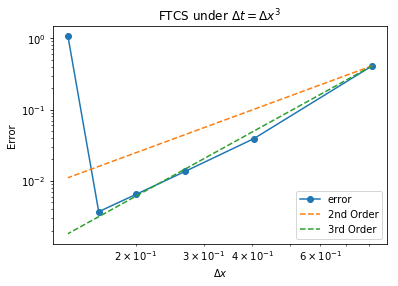

In [11]:
order_C = lambda delta_x, error, order: numpy.exp(numpy.log(error) - order * numpy.log(delta_x))
error_FTCS, delta_x = [], []
c_1 = 2.
dt = 0.0001
t_real = 2.
t_range = np.arange(0., 1., dt)
u_ini_single = lambda x: 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8)/2.))**(-2)

for N in [50, 100, 150, 200, 250, 300]:
    dt_ = (10. / N)**3
    U, x, nplt = first(N, dt=dt_, f=u_ini_single, t_final=1.)
    
    dx = x[1] - x[0]
    delta_x.append(dx)
    u_true = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - t_real)/2.))**(-2)
    error_FTCS.append(np.linalg.norm(dx * (U[-1, :] - u_true)))
 
fig = plt.figure()
axes = fig.add_subplot(1, 1, 1)
axes.loglog(delta_x, error_FTCS, '-o', label = 'error')
axes.loglog(delta_x, order_C(delta_x[0], error_FTCS[0], 2.0) * np.array(delta_x)**2.0, '--', label="2nd Order")
axes.loglog(delta_x, order_C(delta_x[0], error_FTCS[0], 3.0) * np.array(delta_x)**3.0, '--', label="3rd Order")
axes.legend()
axes.set_xlabel('$ \Delta x$')
axes.set_ylabel('Error')
axes.set_title('FTCS under $ \Delta t = \Delta x^3$')

**Comment:** Here for the first couple $\Delta x$, FTCS is ok but as it get smaller, it blow it.

#### 2.2.3 Analysis on Zabusky and Kruskal Scheme

**Trancation error analysis for Leapfrog**

$$
    \begin{aligned}
    \frac{U_j^{n+1} - U_j^{n-1}}{2 \Delta t} &= u_t + \mathcal{o}(\Delta t^2) \\
    2 （U_{j+1}^n + U_j^n + U_{j-1}^n) \frac{U_{j+1}^n - U_{j-1}^n}{2 \Delta x} &= 2（3 u + \mathcal{o}(\Delta x^2)) (u_x + \mathcal{o}(\Delta x^2)) =  6 uu_x + \mathcal{o}(\Delta x^2) \\ 
    \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3} &= u_{xxx} + \mathcal{o}(\Delta x^2)
    \end{aligned}
$$

Thus,

$$
    \begin{aligned}
    &\frac{U_j^{n+1} - U_j^{n-1}}{2 \Delta t} + 2 （U_{j+1}^n + U_j^n + U_{j-1}^n) \frac{U_{j+1}^n - U_{j-1}^n}{2 \Delta x} + \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3} - ( u_t + 6uu_x + u_{xxx}) \\
    &= u_t + \mathcal{o}(\Delta t^2) + 6 uu_x + \mathcal{o}(\Delta x^2) + u_{xxx} + \mathcal{o}(\Delta x^2) - ( u_t + 6uu_x + u_{xxx}) \\
    &= \mathcal{o}(\Delta x^2) + \mathcal{o}(\Delta t^2)
    \end{aligned}
$$

Notice that $\Delta t < \frac{2\Delta x^3}{3 \sqrt{3}}$ from von Neumann analysis

$$
    \mathcal{o}(\Delta t^2) = \mathcal{o}(\Delta x^6) < \mathcal{o}(\Delta x^2)
$$

Therefore, the trancation error will be $$\epsilon_t = \mathcal{o}(\Delta x^2)$$

**Modified equation for Leapfrog**

$$
    \begin{aligned}
    \frac{U_j^{n+1} - U_j^{n-1}}{2 \Delta t} &= u_t + \mathcal{o}(\Delta t^2) \\
    2 （U_{j+1}^n + U_j^n + U_{j-1}^n) \frac{U_{j+1}^n - U_{j-1}^n}{2 \Delta x} &= 2（3 u + \Delta xu_{xx} \mathcal{o}(\Delta x^4)) (u_x + \frac{\Delta x^2}{6} u_{xxx} + \mathcal{o}(\Delta x^4)) \\
    &=  6 uu_x + 2\Delta x u_x u_{xx} + \Delta x^2 u u_{xxx} + \mathcal{o}(\Delta x^4) \\ 
    \frac{U_{j+2}^n - 2 U_{j+1}^n + 2 U_{j-1}^n - U_{j-2}^n}{2 \Delta x^3} &= u_{xxx} + \frac{\Delta x^2}{4} u_{xxxxx}\mathcal{o}(\Delta x^4)
    \end{aligned}
$$

Plug in Leapfrog

$$
    u_t + \mathcal{o}(\Delta t^2) = - (6 uu_x + 2\Delta x u_x u_{xx} + \Delta x^2 u u_{xxx} + \mathcal{o}(\Delta x^4)) - (u_{xxx} + \frac{\Delta x^2}{4} u_{xxxxx}\mathcal{o}(\Delta x^4))
$$

After simplification, we get

$$
    u_t = - 6 (u + \frac{\Delta x}{3} u_{xx})u_x - (1 + \Delta x^2 u)u_{xxx} + \frac{\Delta x^2}{4} u_{xxxxx} + \mathcal{o}(\Delta x^4)
$$

Here we do a convergence plot for the Zabusky against the different $\Delta x$ ($\Delta t$ change accordingly).

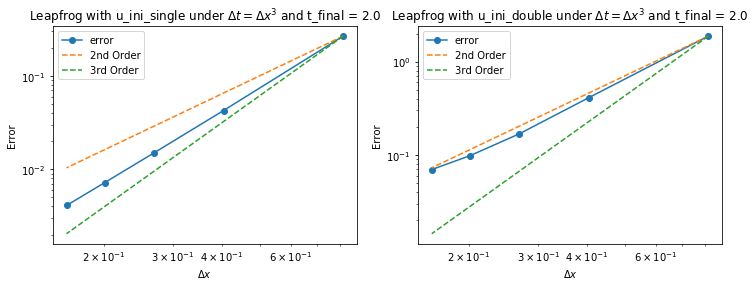

In [12]:

u_ini_single = lambda x: 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8)/2.))**(-2)
u_true_single = lambda x, t: 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2)
u_ini_double = lambda x: 0.5*c_1*(np.cosh(np.sqrt(c_1)*(x)/2.))**(-2) + 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+8)/2.))**(-2)
u_true_double = lambda x, t:0.5*c_1*(np.cosh(np.sqrt(c_1)*(x - c_1*t)/2.))**(-2) + 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+8 - c_2*t)/2.))**(-2)

order_C = lambda delta_x, error, order: numpy.exp(numpy.log(error) - order * numpy.log(delta_x))
error_leapSingle,error_leapDouble, delta_x = [], [], []
c_1 = 2.
dt = 0.001
t_final = 2.
t_range = np.arange(0., 1., dt)

for N in [50, 100, 150, 200, 250]:
    dt_ = (10. / N)**3
    U_single, x, nplt = leap_frog(N, dt=dt_, f=u_ini_single, t_final=t_final)
    U_double, x, nplt = leap_frog(N, dt=dt_, f=u_ini_double, t_final=t_final)
    
    dx = x[1] - x[0]
    delta_x.append(dx)
    u_true_single = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t_final)/2.))**(-2)
    u_true_double = 0.5*c_1*(np.cosh(np.sqrt(c_1)*(x - c_1*t_final)/2.))**(-2) + 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+8 - c_2*t_final)/2.))**(-2)
    
    error_leapSingle.append(np.linalg.norm(dx * (U_single[-1, :] - u_true_single)))
    error_leapDouble.append(np.linalg.norm(dx * (U_double[-1, :] - u_true_double)))
 
fig = plt.figure()
fig.set_figwidth(fig.get_figwidth() * 2)

axes = fig.add_subplot(1, 2, 1)
axes.loglog(delta_x, error_leapSingle, '-o', label = 'error')
axes.loglog(delta_x, order_C(delta_x[0], error_leapSingle[0], 2.0) * np.array(delta_x)**2.0, '--', label="2nd Order")
axes.loglog(delta_x, order_C(delta_x[0], error_leapSingle[0], 3.0) * np.array(delta_x)**3.0, '--', label="3rd Order")
axes.legend()
axes.set_xlabel('$ \Delta x$')
axes.set_ylabel('Error')
axes.set_title('Leapfrog with u_ini_single under $ \Delta t = \Delta x^3$ and t_final = %s' %(t_final))

axes = fig.add_subplot(1, 2, 2)
axes.loglog(delta_x, error_leapDouble, '-o', label = 'error')
axes.loglog(delta_x, order_C(delta_x[0], error_leapDouble[0], 2.0) * np.array(delta_x)**2.0, '--', label="2nd Order")
axes.loglog(delta_x, order_C(delta_x[0], error_leapDouble[0], 3.0) * np.array(delta_x)**3.0, '--', label="3rd Order")
axes.legend()
axes.set_xlabel('$ \Delta x$')
axes.set_ylabel('Error')
axes.set_title('Leapfrog with u_ini_double under $ \Delta t = \Delta x^3$ and t_final = %s' %(t_final))



**Comment:** 

Since Zabusky scheme works on single and double soltions, so we do a convergence plot in this two cases.  For one soliton, it performs better than second order and on two solitons, we get second order convergence as expected from our analysis.

### 2.3 Spectral Method -- Fast Fourier Transform

Spectral method are often applied to approximate solutions to partial differential equations because of its  spectral accuracy, meaning the accuracy follows an exponential convergence rate. The basic idea behind spectral method is to write the solution of the PDE as a linear combination of basis function, then select the coefficient so that the resulting linear combination approximates the solution decently.

#### 2.3.1 Fast Fourier Transform
Recall that the Fourier transform is given by: [6]
$$\mathcal{F}[f(x)] = \bar{f}(k) = \int^{\infty}_{-\infty} f(x)e^{-ikx}dx,$$
and the inverse Fourier transform is given by:
$$f(x) = \mathcal{F}^{-1}[\bar{f}(k)] = \frac{1}{2\pi}\int^{\infty}_{-\infty} \bar{f}(k)e^{ikx}dk$$

Here we noted an important property of Fourier transform that we will use to solve the KdV -- the Fourier transform on spactial derivatives:

$$
\begin{aligned}
\int^{\infty}_{-\infty}\left(\frac{\partial f(x)}{\partial x}\right) e^{-ikx}dx & = -\int^{\infty}_{-\infty}f(x) \left(\frac{\partial e^{-ikx}}{\partial x}\right)dx \\
& = ik -\int^{\infty}_{-\infty} f(x) e^{-ikx}dx 
\end{aligned}
$$

And Fast Fourier Transform (denoted as *** FFT ***) that we use here is the algorithm computes the discrete Fourier transform (DFT) of a sequence, or its inverse with $\mathcal{O}(n\log n)$. Discrete Fourier transform follow:
$$X_k = \sum^{N-1}_{n=0}x_n\cdot e^{\frac{-i2\pi kn}{N}}$$
with inverse follows:
$$x_n = \frac{1}{N}\sum^{N}_{k=0}X_k\cdot e^{\frac{i2\pi n}{N}}$$
with $k \in [-N/2, N/2 -1]$.

#### 2.2.2 Forward Euler with Split Step method
In this subsection, we solve the KdV equation using spectral method with forward euler and split step. [6]  KdV is: (we will use $\bar{ }$ to denote function in fourier space).

$$\partial_t u + 3\partial_x(u)^2 + \partial^3_x u = 0$$
Use Fourier Transform and we write the equation by space and time:

$$\partial_t \bar{u} + 3ik\bar{(u^2)} - ik^3\bar{u} = 0$$

$$\partial_t \bar{u} = -3ik\bar{(u^2)} + ik^3\bar{u}$$

Note at this point, the space part has parts: a linear component $ik^3\bar{u}$ and a nonlinear component $-3ik\bar{(u^2)}$.

By supercomposition, we can exactly solve:
$$\partial_t \bar{u}  = ik^3\bar{u}$$
but need to use time stepping method to solve:
$$\partial_t \bar{u}  = -3ik\bar{(u^2)}$$

So while stepping $t$ to $t+\Delta t$, we solve:

$$\bar{u_0}(k, t+\Delta t) = \bar{u}(k,t)e^{ik^3\Delta t}$$

$$\bar{u}(k, t+\Delta t) = \bar{u_0}(k, t+\Delta t) - 3ik\Delta t\bar{(u_0^2)}$$

At this point, we use forward euler to do the time stepping, but we cannot directly apply the equation above because $\bar{(u_0^2)}$ is not in fourier space yet. So we apply Fourier Transform again, and we have the final formulation:

$$\bar{u_0}(k, t+\Delta t) = \bar{u}(k,t)e^{ik^3\Delta t}$$

$$\bar{u}(k, t+\Delta t) = \bar{u_0}(k, t+\Delta t) - 3ik\Delta t\left(\mathcal{F}\left(\left(\mathcal{F}^{-1}[\bar{u_0}(k,t+\Delta t)]\right)^2\right)\right)$$

**Code Implementation**

In [13]:
def FFT_Split(N, u_0, x, t0, tfinal, delta_t):
    
    delta_x = x[1] - x[0]
    delta_k = 2.*np.pi/(N*delta_x)
    test1 = np.arange(0, (N / 2.) * delta_k, delta_k)
    test2 = np.arange(-(N / 2.-1) * delta_k, 0.0 , delta_k)
    k = numpy.append(test1, 0.0)
    k = numpy.append(k, test2)

    tdata = np.arange(t0,tfinal, delta_t);
    
    u = u_0
    U = fft.fft(u)
    X,T = np.meshgrid(x,tdata)
    Ua = np.empty((len(tdata),len(x)))
    Ua[0,:] = u_0
    
    for n in xrange(1, int(len(tdata))+1):
        t = n*delta_t
        U = U*np.exp(1j*k**3*delta_t)
        U = U  - (3j*k*delta_t)*fft.fft((fft.ifft(U)).real**2)
        Ua[n-1,:] = fft.ifft(U).real
        
    return Ua


In [14]:
c_1 = 16.
c_2 = 4.
def u_true_single(x,t):
#     u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2) #+ 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+1 - c_2*t)/2.))**(-2)
    u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2)
    return u

N = 256
x = np.linspace(-10,10,N)
t0 = 0.
tfinal = 1.

dt = 0.4/(N**2)
U = FFT_Split(N,u_true_single(x,0.), x, t0, tfinal, dt)
t = np.arange(t0,tfinal, dt)
nplt = floor((tfinal/100)/dt) 
nmax = round(tfinal/dt)
# udata = u.transpose()

figs = []
for n in xrange(len(t)):
    T = n*dt
    if n % nplt == 0:
        fig = figure()
        plt.plot(x, U[n,:], 'ro', label = "FFT_Split")
        plt.plot(x, u_true_single(x,T), 'k', label = "True")
        plt.ylim([-0.5, 8.5])
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)

images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

In [15]:

c_1 = 16.
c_2 = 4.
def u_true_double(x,t):
    u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2) + 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+1 - c_2*t)/2.))**(-2)
#     u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2)
    return u

N = 256
x = np.linspace(-10,10,N)
t0 = 0.
tfinal = 1.

dt = 0.4/(N**2)
U = FFT_Split(N,u_true_double(x,0.), x, t0, tfinal, dt)
t = np.arange(t0,tfinal, dt)
nplt = floor((tfinal/100)/dt) 
nmax = round(tfinal/dt)
# udata = u.transpose()

figs = []
for n in xrange(len(t)):
    T = n*dt
    if n % nplt == 0:
        fig = figure()
        plt.plot(x, U[n,:], 'ro', label = "FFT_Split")
        plt.plot(x, u_true_double(x,T), 'k', label = "True")
        plt.ylim([-0.5, 8.5])
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)

images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

**Comment:**

Here for FFT_Split step method, we test also on both single soliton and double solitons.  We see that FFT_Split works well on single soliton but for two solitons, after the interaction, true solution and approximation diverges.


#### 2.3.3 Runge-Kutta 4 with Intergrating Factor
In this subsection, we solve the KdV equation us.ing Runge-Kutta 4 time stepping with intergratng factor. [4]  KdV is: (we will use $\hat{ }$ to denote function in fourier space).

$$u_t + (3u)_x^2 + u_{xxx} = 0$$
Use Fourier Transform and we write the equation by space and time:

$$\bar{u_t} + 3ik\bar{(u^2)} - ik^3\bar{u} =0 $$

Then we muliply both side by the intergrating factor $e^{-ik^3t}$ and the equation becomes:

$$e^{-ik^3t}\bar{u_t} + 3ie^{-ik^3t}k\bar{(u^2)} - ie^{-ik^3t}k^3\bar{u} =0 $$

Then we 
$$\text{Let } \bar{U} = e^{-ik^3t}\bar{u},~~~ \bar{U}_t = -ik^3\bar{U} + e^{-ik^3t}\bar{u_t}$$
Thus,
$$ U_t + ik^3\bar{U} +  3ie^{-ik^3t}k\bar{(u^2)} - ik^3\bar{U} = 0$$
Then,
$$U_t +  3ie^{-ik^3t}k\bar{(u^2)} = 0$$

At this point we do not have linear term and the problem is not stiff [4].  Then again working in the Fourier space we can discretize the problem into:

$$\bar{U}_t + 3ie^{-ik^3t}k\mathcal{F}\left(\left(\mathcal{F}^{-1}\left(e^{ik^3t}\bar{U}\right)\right)^2\right) = 0$$

Then at this point, we use Runge-Kutta 4 method to sole above time stepping derivative.

**Code Implementation**

In [16]:
def FFT_RK4(N, u_0, x, t0, tfinal, delta_t):
    delta_x = x[1] - x[0]
    maxk = int(N*0.5)
    test1 = np.arange(0, maxk, 1.)
    test2 = np.arange(-maxk+1, 0.0 , 1.)
    k = numpy.append(test1, 0.0)
    k = numpy.append(k, test2)
    k = k.transpose()

    tdata = np.arange(t0,tfinal, delta_t);
    
    ik3 = 1j*k**3
    v = fft.fft(u_0)
    Ua = np.empty((len(tdata),len(x)))
    Ua[0,:] = u_0
    
    for n in xrange(1, len(tdata)):
        t = n*delta_t
        g = -0.5j*delta_t*k
        E = np.exp(delta_t*ik3*0.5)
        E2 = E**2

        k1 = g*fft.fft((fft.ifft( v ).real)**2)
        k2 = g*fft.fft((fft.ifft(E*(v+k1*0.5)).real)**2)
        k3 = g*fft.fft((fft.ifft(E*v+k2*0.5).real)**2)
        k4 = g*fft.fft((fft.ifft(E2*v+E*k3).real)**2)

        v = E2*v + (E2*k1 + 2*E*(k2+k3) + k4)/6.
        Ua[n, :] = fft.ifft(v).real
    return Ua


In [17]:
N = 2**8
L = 2*np.pi
dt = 0.4/(N**2)
x = np.linspace(-np.pi,np.pi-2.*np.pi/N,N)
A = 5
t0 = 0.
tfinal = 0.1
def u_true_single(x, t):
#     u = 3.*A**2*np.cosh(0.5*(A*(x+2. - A**2*t)))**(-2) + 3.*B**2*np.cosh(0.5*(B*(x+1. - B**2*t)))**(-2)
    u = 3.*A**2*np.cosh(A*(x+2)*0.5 - A**3*t*0.5)**(-2)
    return u

U = FFT_RK4(N,u_true_single(x,0.0), x, t0, tfinal, dt)
t = np.arange(t0,tfinal, dt)

nplt = floor((tfinal/100)/dt) 
nmax = round(tfinal/dt)
# udata = u.transpose()

figs = []
for n in xrange(len(t)):
    T = n*dt
    if n % nplt == 0:
        fig = figure()
        plt.plot(x, U[n,:],'ro', label="FFT_RK4")
        plt.plot(x,u_true_single(x,T),'k', label = "True")
        plt.ylim([-5, 85])
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)

images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

In [18]:
N = 2**7
L = 2*np.pi
dt = 0.4/(N**2)
x = np.linspace(-np.pi,np.pi-2.*np.pi/N,N)
A = 5.
B = 2.
t0 = 0.
tfinal = 0.1
def u_true_double(x, t):
    u = 3.*A**2*np.cosh(A*(x+2)*0.5 - A**3*t*0.5)**(-2) + 3.*B**2*np.cosh(A*(x)*0.5 - B**3*t*0.5)**(-2)
#     u = 3.*A**2*np.cosh(A*(x+2)*0.5 - A**3*t*0.5)**(-2)
    return u

U = FFT_RK4(N,u_true_double(x,0.0), x, t0, tfinal, dt)
t = np.arange(t0,tfinal, dt)

nplt = floor((tfinal/100)/dt) 
nmax = round(tfinal/dt)
# udata = u.transpose()

figs = []
for n in xrange(len(t)):
    T = n*dt
    if n % nplt == 0:
        fig = figure()
        plt.plot(x, U[n,:],'ro', label="FFT_RK4")
        plt.plot(x,u_true_double(x,T),'k', label = "True")
        plt.ylim([-5, 85])
        plt.legend(loc=2)
        figs.append(fig)
        close(fig)

images = animation_tools.make_images(figs)
animation_tools.JSAnimate_images(images)

**Comment:**

Here for FFT_RK4 step method, we test also on both single soliton and double solitons. The same as FTT_Spilt, we see that FFT_Split works well on single soliton but for two solitons, after the interaction, true solution and approximation diverges.



### 2.4 Spectral Method Analysis
In this subsection, we will perform error convergence and analysis on both spectral method for split step and intergrating factor. Because we do not familiar how to do numerical analysis on spectral method, we focus on the analysis on doing convergence plots.

#### 2.4.1 Error on Split Step method


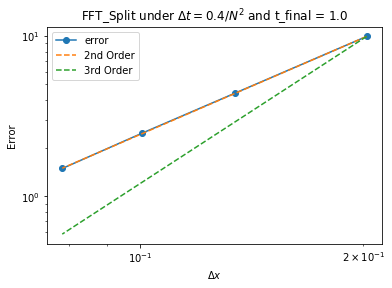

In [19]:
order_C = lambda delta_x, error, order: numpy.exp(numpy.log(error) - order * numpy.log(delta_x))
error_split, delta_x = [], []
t0 = 0.
t_final = 1.

c_1 = 16.
c_2 = 4.
def u_true_single(x,t):
#     u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2) #+ 0.5*c_2*(np.cosh(np.sqrt(c_2)*(x+1 - c_2*t)/2.))**(-2)
    u = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t)/2.))**(-2)
    return u


for N in [100, 150, 200, 256]:
    x = np.linspace(-10,10,N)
    dt = 0.4/(N**2)
#     t = np.arange(t0,tfinal, dt)
#     U = FFT_Split(N,u_true_single(x,0.0), x, t0, tfinal, dt)
    U = FFT_Split(N,u_true_single(x,0.), x, t0, t_final, dt)
    dx = x[1] - x[0]
    delta_x.append(dx)
#     u_true_single = 0.5 * c_1 * (np.cosh(np.sqrt(c_1)*(x+8 - c_1*t_final)/2.))**(-2)
    error_split.append(np.linalg.norm(dx* (U[-1, :] - u_true_single(x, t_final)), ord = 1))

# print error_split  
fig = plt.figure()
axes = fig.add_subplot(1, 1, 1)
axes.loglog(delta_x, error_split, '-o', label = 'error')
axes.loglog(delta_x, order_C(delta_x[0], error_split[0], 2.0) * np.array(delta_x)**2.0, '--', label="2nd Order")
axes.loglog(delta_x, order_C(delta_x[0], error_split[0], 3.0) * np.array(delta_x)**3.0, '--', label="3rd Order")
axes.legend()
axes.set_xlabel('$ \Delta x$')
axes.set_ylabel('Error')
axes.set_title('FFT_Split under $ \Delta t = 0.4/N^2 $ and t_final = %s' %(t_final))

**Comment**

Here we see that we have second order convergence on the FFT_Split method.

#### 2.4.2 Error on Intergrating factor

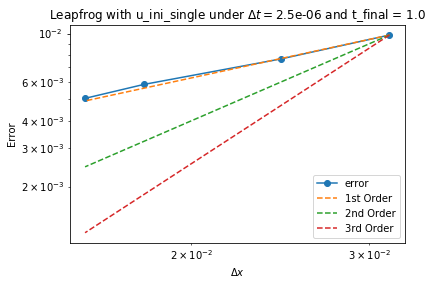

In [20]:
order_C = lambda delta_x, error, order: numpy.exp(numpy.log(error) - order * numpy.log(delta_x))
error_RK4, delta_x = [], []

A = 5
t0 = 0.
tfinal = 0.1
def u_true_single(x, t):
    u = 3.*A**2*np.cosh(A*(x+2)*0.5 - A**3*t*0.5)**(-2)
    return u



for N in [200, 256, 350, 400]:
    x = np.linspace(-np.pi,np.pi-2.*np.pi/N,N)
#     x = np.linspace(-10, 10, N)
    dt = 0.4/(N**2)
#     t = np.arange(t0,tfinal, dt)
    U = FFT_RK4(N,u_true_single(x,0.0), x, t0, tfinal, dt)

    dx = x[1] - x[0]
    delta_x.append(dx)

    error_RK4.append(np.linalg.norm(dx* (U[-1, :] - u_true_single(x, tfinal)), ord = infty))
    
fig = plt.figure()
axes = fig.add_subplot(1, 1, 1)
axes.loglog(delta_x, error_RK4, '-o', label = 'error')
axes.loglog(delta_x, order_C(delta_x[0], error_RK4[0], 1.0) * np.array(delta_x)**1.0, '--', label="1st Order")
axes.loglog(delta_x, order_C(delta_x[0], error_RK4[0], 2.0) * np.array(delta_x)**2.0, '--', label="2nd Order")
axes.loglog(delta_x, order_C(delta_x[0], error_RK4[0], 3.0) * np.array(delta_x)**3.0, '--', label="3rd Order")
axes.legend()
axes.set_xlabel('$ \Delta x$')
axes.set_ylabel('Error')
axes.set_title('Leapfrog with u_ini_single under $ \Delta t = $%s and t_final = %s' %(dt, t_final))

**Comment:**

Contradict to our expectation, we only see first order convergence in FFT_RK4 even though the reference states it should have 4th order and we are struggling to figure out why and running out of time. 

## 3. Conclusion

### 3.1 Finite Difference
**Strongness**

1. The illustration of FTCS and Leapfrog are easy to understand and implement, which are based on finite difference

2. We implemented a good simulation of single soliton wave and double soliton waves without touching the boundary (the true solution is in the infinite domain)

3. FTCS in stable time period achieves third-order convergence rate and it is beyond what we expect as second order convergence rate; Leapfrog in all time period also achieves better than second order convergence rate for single soliton wave and achieves exact second order convergence rate for double soliton waves as we proved before.

4. We analyze the possible reasons why FTCS failed and its required range for $\Delta t$

**Weakness**

1. Both methods are entry-level finite difference applied to the KdV equation, which does not involve advanced numerical methods and skills

2. We failed to prove the required range for $\Delta t$ in Leapfrog methods

3. We do not find more advanced information from modified equations of both methods

4. We cannot provide the reason why FTCS behaves better than we proved before it blows up

### 3.2 Spectral Method 
**Strongness**

1. In term of programming, a spectral method is easy to implement because of the use of FFT and transform into FFT make our equation solvable.

2. Unlike Finite difference, spectral method handles nonlinear term is easier because of Fourier Transform and we can use high-level time stepping method such as RK4 to compute our equations.

**Weakness**

1. In term of analytical approach, a spectral method is a lot hard to construct and easy to make mistakes.

2. Based on our result, we see that both initial condition and $\Delta t$ is extremely sensitive and a slight change in both may result in divergence of our solution

3. For both spectral, we require a large number of $N$ in $x$ since a small number of $x$ will result in misrepresenting of our initial condition and leads to diverging of our solution.

4. In addition, we also need a very small $\Delta t = \frac{0.4}{N^2}$ in both spectral method in order to maintain the stability of the solution and thus it requires a long time compute $t=1$. 

5. Because we are unfamiliar with the formulation behind the spectral method, we cannot perform error analysis like finite difference, which later one give us a clear sense of what to expect.

6. We follow difference references to construct our spectral code. In that reference, spectral perform extremely well where the convergence is fourth order and the error is around $10^{-8}$.  But based on our test, we fail to see those good result and struggle to understand the reason behind it.



## References
[1] Thiab R. T and Mark J .A (1984). Analytical and Numerical Aspects of Certain Nonlinear Evolution Equations. III. Numerical, Korteweg-de Vries Equation. Journal of Computational Physics.

[2] Klaus Brauer (2000). The Korteweg-de Vries Equation: History, exact Solutions, and graphical Representation. University of Osnabruck/Germany

[3] Felipe L (2015). Introduction to Nonlinear Dispersive Equations. Springer

[4] Lloyd N. T. Spectral Method in Matlab 

[5] Masitah S. (2015). Applying Explicit Schemes to the Korteweg-de Varies Equation. Canadian Center of Science and Education 

[6] Numerical Solution of the KdV.  Wikiwaves.org. http://www.wikiwaves.org/Numerical_Solution_of_the_KdV